In [ ]:
 from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Aug+Real"
classes = ["fresh", "infected"]

# Dictionary to store counts
image_counts = {}

for cls in classes:
    path = os.path.join(dataset_path, cls)
    count = len([f for f in os.listdir(path) if f.lower().endswith(('.png','.jpg','.jpeg'))])
    image_counts[cls] = count

# Print counts
for cls, count in image_counts.items():
    print(f"{cls} → {count} images")

print("\n✅ Total Images:", sum(image_counts.values()))
import os

dataset_path = "/content/drive/MyDrive/Aug+Real"
classes = ["fresh", "infected"]

# Dictionary to store counts
image_counts = {}

for cls in classes:
    path = os.path.join(dataset_path, cls)
    count = len([f for f in os.listdir(path) if f.lower().endswith(('.png','.jpg','.jpeg'))])
    image_counts[cls] = count

# Print counts
for cls, count in image_counts.items():
    print(f"{cls} → {count} images")

print("\n✅ Total Images:", sum(image_counts.values()))

fresh → 5000 images
infected → 5000 images

✅ Total Images: 10000
fresh → 5000 images
infected → 5000 images

✅ Total Images: 10000


In [ ]:
import os
import shutil
import random
from sklearn.model_selection import train_test_split


# Paths
Final_data_path = "/content/drive/MyDrive/Aug+Real"
output_dir = "/content/Final_split"

# Classes (from your final dataset)
classes = ["fresh", "infected"] # Removed "Unknown"

# Clean old split if exists
shutil.rmtree(output_dir, ignore_errors=True)

# Create output folders
for split in ["train", "val", "test"]:
    for cls in classes:
        os.makedirs(os.path.join(output_dir, split, cls), exist_ok=True)

# Split ratio
train_ratio = 0.8
val_ratio = 0.10
test_ratio = 0.10

random.seed(42)  # reproducibility

for cls in classes:
    class_dir = os.path.join(Final_data_path, cls)

    if not os.path.exists(class_dir):
        print(f"⚠️ Skipping {cls} because folder not found")
        continue

    all_files = [f for f in os.listdir(class_dir)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # First split: train vs temp (val+test)
    train_files, temp_files = train_test_split(
        all_files, test_size=1-train_ratio, random_state=42
    )

    # Second split: val vs test
    val_files, test_files = train_test_split(
        temp_files, test_size=test_ratio/(val_ratio+test_ratio), random_state=42
    )

    # Copy files to respective directories
    for f in train_files:
        src = os.path.join(class_dir, f)
        dst = os.path.join(output_dir, "train", cls, f)
        shutil.copy2(src, dst)

    for f in val_files:
        src = os.path.join(class_dir, f)
        dst = os.path.join(output_dir, "val", cls, f)
        shutil.copy2(src, dst)

    for f in test_files:
        src = os.path.join(class_dir, f)
        dst = os.path.join(output_dir, "test", cls, f)
        shutil.copy2(src, dst)

    print(f"✅ {cls}: {len(train_files)} train, {len(val_files)} val, {len(test_files)} test")

print("\n🎯 Dataset split completed!")

✅ fresh: 4000 train, 500 val, 500 test
✅ infected: 4000 train, 500 val, 500 test

🎯 Dataset split completed!


Classes: ['fresh', 'infected']
Found 8000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 25,819,202 (98.49 MB)

 Trainable params: 25,817,986 (98.49 MB)

 Non-trainable params: 1,216 (4.75 KB)

Epoch 1/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 129s 470ms/step - accuracy: 0.9643 - loss: 0.1102 - val_accuracy: 0.5000 - val_loss: 1.9945
Epoch 2/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 109s 434ms/step - accuracy: 0.9914 - loss: 0.0298 - val_accuracy: 0.9010 - val_loss: 0.2317
Epoch 3/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 106s 423ms/step - accuracy: 0.9967 - loss: 0.0162 - val_accuracy: 0.9910 - val_loss: 0.0255
Epoch 4/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 107s 427ms/step - accuracy: 0.9958 - loss: 0.0175 - val_accuracy: 0.9950 - val_loss: 0.0168
Epoch 5/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 114s 455ms/step - accuracy: 0.9956 - loss: 0.0173 - val_accuracy: 0.9990 - val_loss: 0.0044
Epoch 6/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 109s 437ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.9970 - val_loss: 0.0145
Epoch 7/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 115s 459ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.9990 - val_loss: 0.0044
Epoch 8/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 105s 421ms/step - accuracy: 0.9990 -

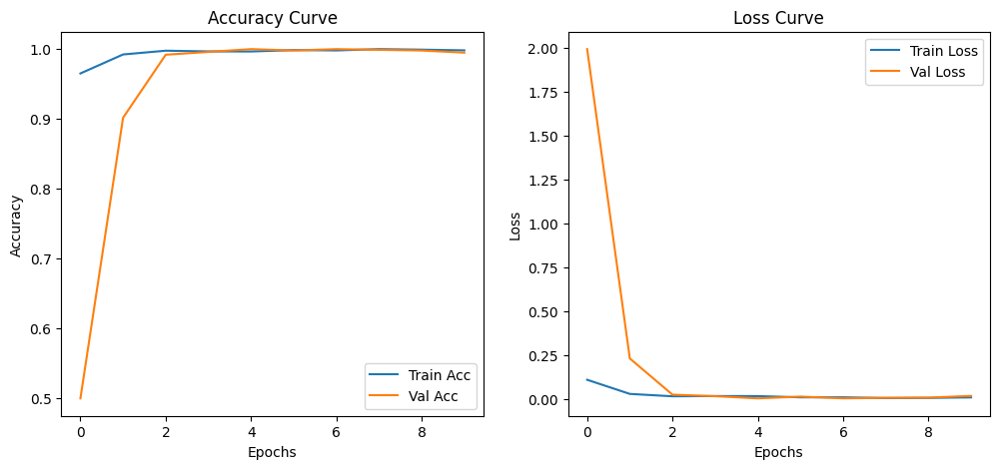

32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 367ms/step


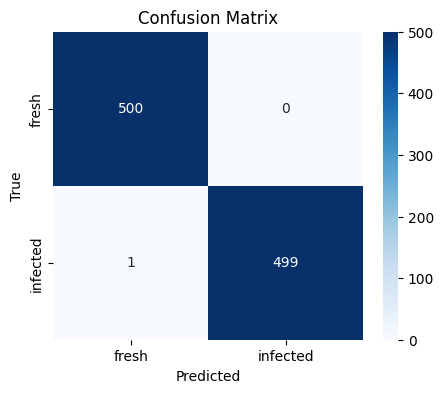


Classification Report:

              precision    recall  f1-score   support

       fresh     0.9980    1.0000    0.9990       500
    infected     1.0000    0.9980    0.9990       500

    accuracy                         0.9990      1000
   macro avg     0.9990    0.9990    0.9990      1000
weighted avg     0.9990    0.9990    0.9990      1000


🔹 Macro Average Accuracy (Precision Avg) : 0.9990
🔹 Overall Test Accuracy: 0.9990


In [ ]:
# --------------------------
# CNN (Fresh vs Infected) - Complete with Macro Accuracy
# --------------------------
import os
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# --------------------------
# Paths & parameters
# --------------------------
output_dir = "/content/Final_split"
img_size = (224, 224)
batch_size = 32
epochs = 10   # change if needed

# Class names
class_names = sorted(os.listdir(os.path.join(output_dir, "train")))
print("Classes:", class_names)

# --------------------------
# Data Generators
# --------------------------
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen   = ImageDataGenerator(rescale=1./255)
test_datagen  = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    os.path.join(output_dir, "train"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    shuffle=True
)

val_gen = val_datagen.flow_from_directory(
    os.path.join(output_dir, "val"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    shuffle=True
)

test_gen = test_datagen.flow_from_directory(
    os.path.join(output_dir, "test"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    shuffle=False
)

# --------------------------
# Refined CNN Model
# --------------------------
model_cnn = Sequential([
    Conv2D(32, (3,3), padding="same", input_shape=(224,224,3)),
    BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    MaxPooling2D((2,2)),

    Conv2D(64, (3,3), padding="same"),
    BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    MaxPooling2D((2,2)),

    Conv2D(128, (3,3), padding="same"),
    BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    MaxPooling2D((2,2)),

    Flatten(),
    Dense(256),
    BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    Dropout(0.5),

    Dense(128),
    BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    Dropout(0.3),

    Dense(len(class_names), activation='softmax')
])

model_cnn.compile(
    optimizer=Adam(1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model_cnn.summary()

# --------------------------
# Callbacks
# --------------------------
checkpoint_path = "best_cnn_model.keras"  # future-proof format
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True)
]

# --------------------------
# Train Model
# --------------------------
history = model_cnn.fit(
    train_gen,
    validation_data=val_gen,
    epochs=epochs,
    callbacks=callbacks
)

# --------------------------
# Plot Loss & Accuracy
# --------------------------
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label="Train Acc")
plt.plot(history.history['val_accuracy'], label="Val Acc")
plt.title("Accuracy Curve")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Val Loss")
plt.title("Loss Curve")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# --------------------------
# Evaluation on Test Data (with Macro Accuracy)
# --------------------------
y_pred = model_cnn.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
report = classification_report(y_true, y_pred_classes, target_names=class_names, digits=4, output_dict=True)
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names, digits=4))

# --------------------------
# Macro Accuracy (Average Precision) & Overall Accuracy
# --------------------------
macro_accuracy = np.mean([report[cls]['precision'] for cls in class_names])
print(f"\n🔹 Macro Average Accuracy (Precision Avg) : {macro_accuracy:.4f}")

overall_acc = np.mean(y_true == y_pred_classes)
print(f"🔹 Overall Test Accuracy: {overall_acc:.4f}")

Classes: ['fresh', 'infected']
Found 8000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 134, 134,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 32, 32,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 32, 32,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 32, 32,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 32, 32,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 32, 32,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 32, 32,    │     12,288 │ conv2_block2_0_r

 Total params: 7,334,594 (27.98 MB)

 Trainable params: 663,490 (2.53 MB)

 Non-trainable params: 6,671,104 (25.45 MB)

Epoch 1/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 208s 693ms/step - accuracy: 0.7974 - loss: 1.5121 - val_accuracy: 0.9980 - val_loss: 1.0570
Epoch 2/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 148s 591ms/step - accuracy: 0.9626 - loss: 1.0580 - val_accuracy: 0.9990 - val_loss: 0.8943
Epoch 3/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 214s 639ms/step - accuracy: 0.9846 - loss: 0.8971 - val_accuracy: 0.9990 - val_loss: 0.8010
Epoch 4/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 142s 566ms/step - accuracy: 0.9910 - loss: 0.8028 - val_accuracy: 0.9990 - val_loss: 0.7368
Epoch 5/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 165s 658ms/step - accuracy: 0.9944 - loss: 0.7383 - val_accuracy: 0.9990 - val_loss: 0.6878
Epoch 6/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 147s 588ms/step - accuracy: 0.9962 - loss: 0.6890 - val_accuracy: 0.9990 - val_loss: 0.6491
Epoch 7/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 163s 653ms/step - accuracy: 0.9967 - loss: 0.6486 - val_accuracy: 0.9990 - val_loss: 0.6140
Epoch 8/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 145s 581ms/step - accuracy: 0.9969 -

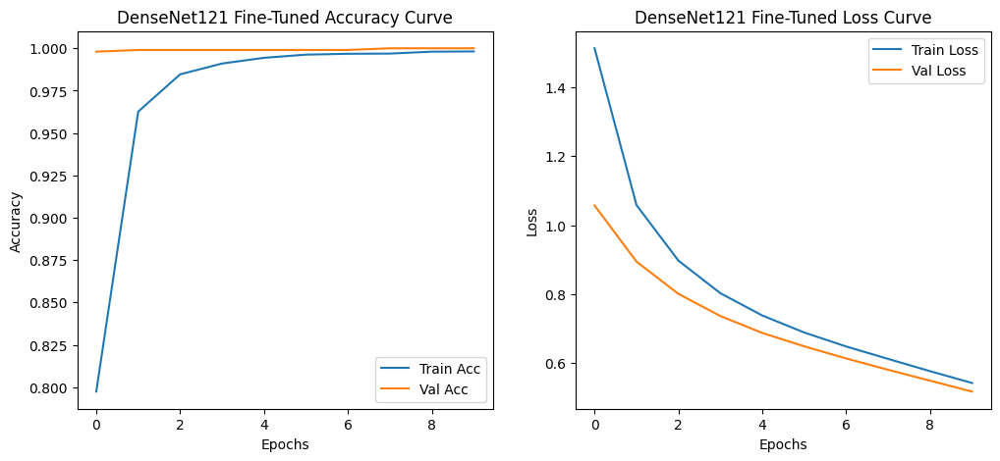

32/32 ━━━━━━━━━━━━━━━━━━━━ 36s 776ms/step


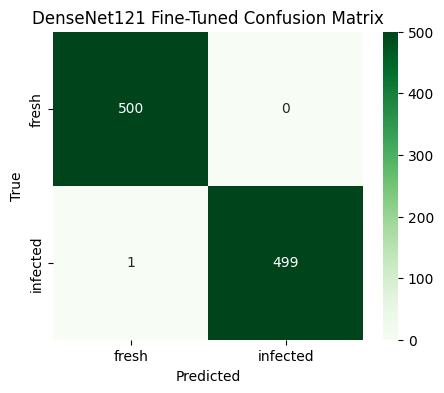


DenseNet121 Fine-Tuned Classification Report:

              precision    recall  f1-score   support

       fresh     0.9980    1.0000    0.9990       500
    infected     1.0000    0.9980    0.9990       500

    accuracy                         0.9990      1000
   macro avg     0.9990    0.9990    0.9990      1000
weighted avg     0.9990    0.9990    0.9990      1000

🔹 DenseNet121 Macro Average Accuracy: 0.9990
🔹 DenseNet121 Overall Test Accuracy: 0.9990


In [ ]:
# --------------------------
# Refined DenseNet121 (Target Accuracy ~95–98%)
# --------------------------
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# --------------------------
# Paths & Parameters
# --------------------------
output_dir = "/content/Final_split"
img_size = (128, 128)  # smaller image size to reduce overfitting
batch_size = 32
epochs = 10

class_names = sorted(os.listdir(os.path.join(output_dir, "train")))
print("Classes:", class_names)

# --------------------------
# Data Generators (Stronger Augmentation)
# --------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.8,1.2],
    fill_mode='nearest'
)

val_datagen  = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    os.path.join(output_dir, "train"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    shuffle=True
)

val_gen = val_datagen.flow_from_directory(
    os.path.join(output_dir, "val"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    shuffle=True
)

test_gen = test_datagen.flow_from_directory(
    os.path.join(output_dir, "test"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    shuffle=False
)

# --------------------------
# Base DenseNet121 Model
# --------------------------
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(img_size[0], img_size[1], 3))

# Freeze most layers (only fine-tune last 20 layers)
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Custom Classification Head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, kernel_regularizer=tf.keras.regularizers.l2(0.002))(x)
x = BatchNormalization()(x)
x = tf.keras.layers.Activation("relu")(x)
x = Dropout(0.6)(x)
x = Dense(128, kernel_regularizer=tf.keras.regularizers.l2(0.002))(x)
x = BatchNormalization()(x)
x = tf.keras.layers.Activation("relu")(x)
x = Dropout(0.4)(x)
predictions = Dense(len(class_names), activation='softmax')(x)

model_densenet = Model(inputs=base_model.input, outputs=predictions)

# --------------------------
# Compile Model
# --------------------------
model_densenet.compile(
    optimizer=Adam(learning_rate=5e-5),  # smaller LR for fine-tuning
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model_densenet.summary()

# --------------------------
# Callbacks
# --------------------------
checkpoint_path = "best_refined_densenet121_v2.keras"
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True)
]

# --------------------------
# Train Model
# --------------------------
history = model_densenet.fit(
    train_gen,
    validation_data=val_gen,
    epochs=epochs,
    callbacks=callbacks
)

# --------------------------
# Plot Accuracy & Loss
# --------------------------
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label="Train Acc")
plt.plot(history.history['val_accuracy'], label="Val Acc")
plt.title("DenseNet121 Fine-Tuned Accuracy Curve")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Val Loss")
plt.title("DenseNet121 Fine-Tuned Loss Curve")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# --------------------------
# Evaluation on Test Data
# --------------------------
y_pred = model_densenet.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("DenseNet121 Fine-Tuned Confusion Matrix")
plt.show()

report = classification_report(y_true, y_pred_classes, target_names=class_names, digits=4, output_dict=True)
print("\nDenseNet121 Fine-Tuned Classification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names, digits=4))

# --------------------------
# Macro Accuracy & Overall Accuracy
# --------------------------
macro_accuracy = np.mean([report[cls]['precision'] for cls in class_names])
overall_acc = np.mean(y_true == y_pred_classes)
print(f"🔹 DenseNet121 Macro Average Accuracy: {macro_accuracy:.4f}")
print(f"🔹 DenseNet121 Overall Test Accuracy: {overall_acc:.4f}")

Saving WhatsApp Image 2026-05-03 at 20.23.36 (5).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (5).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


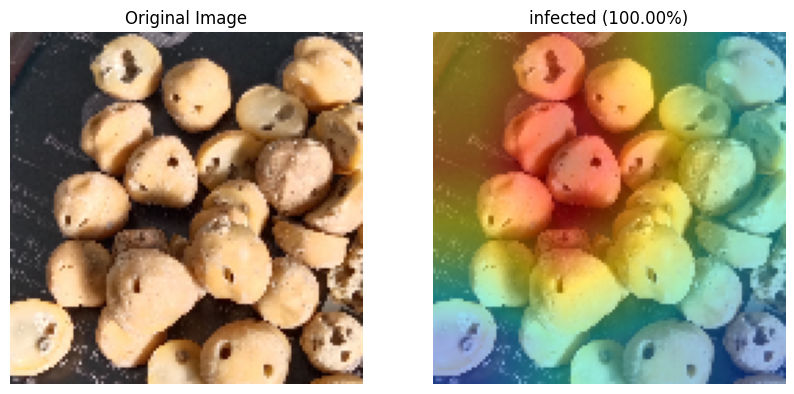

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36 (4).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (4).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


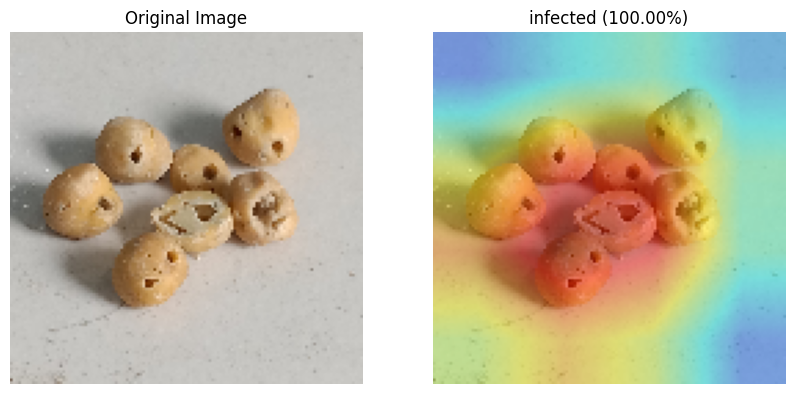

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36 (3).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (3).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


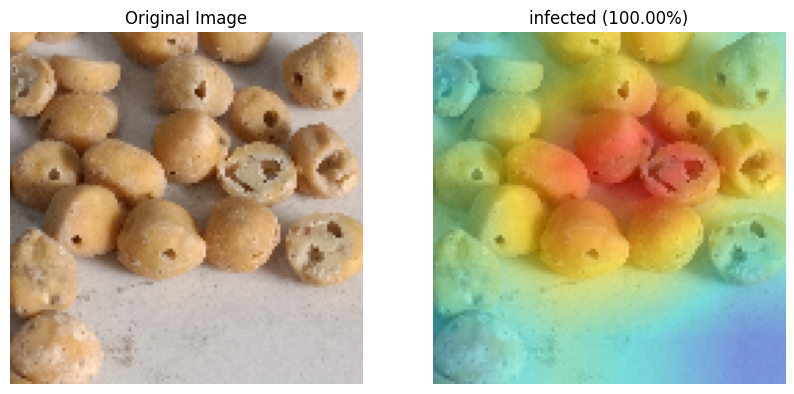

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36 (2).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (2).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


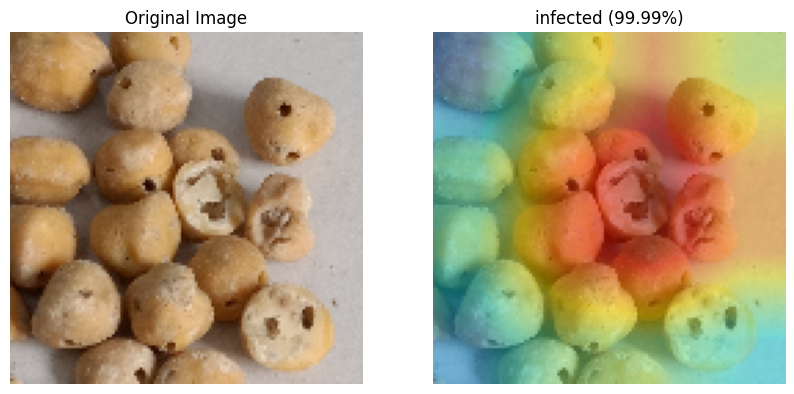

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36.jpeg to WhatsApp Image 2026-05-03 at 20.23.36.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


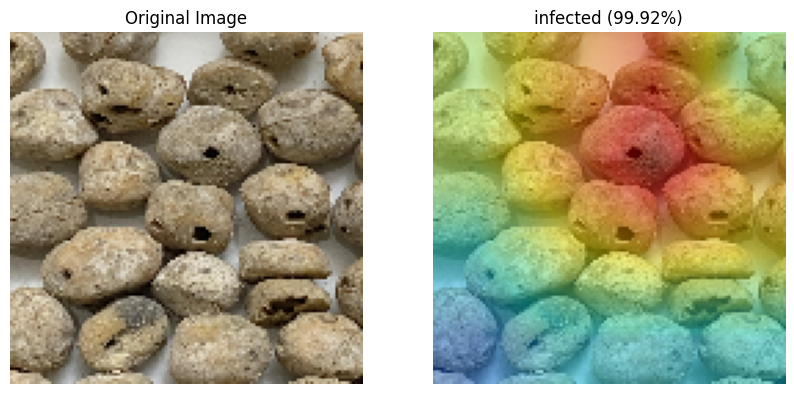

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.37 (4).jpeg to WhatsApp Image 2026-05-03 at 20.23.37 (4).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


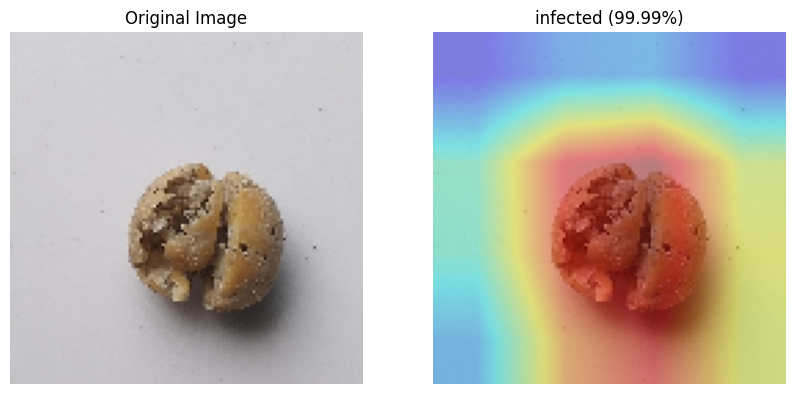

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.37 (3).jpeg to WhatsApp Image 2026-05-03 at 20.23.37 (3).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


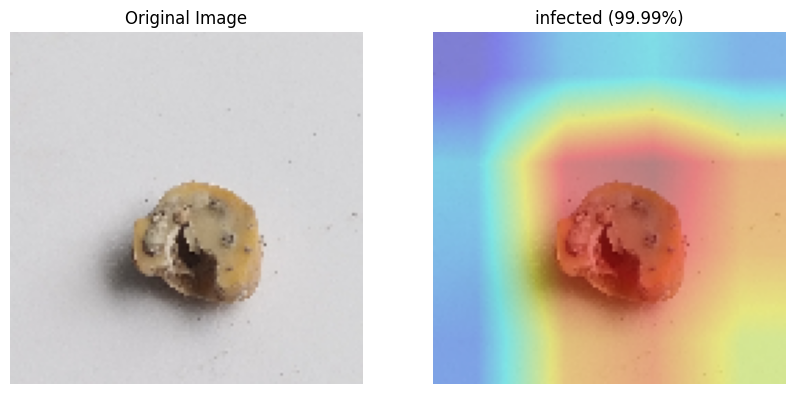

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.37 (2).jpeg to WhatsApp Image 2026-05-03 at 20.23.37 (2).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


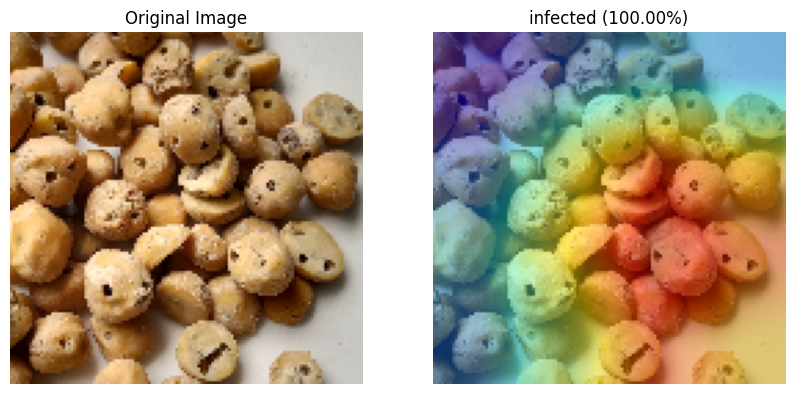

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.37 (1).jpeg to WhatsApp Image 2026-05-03 at 20.23.37 (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


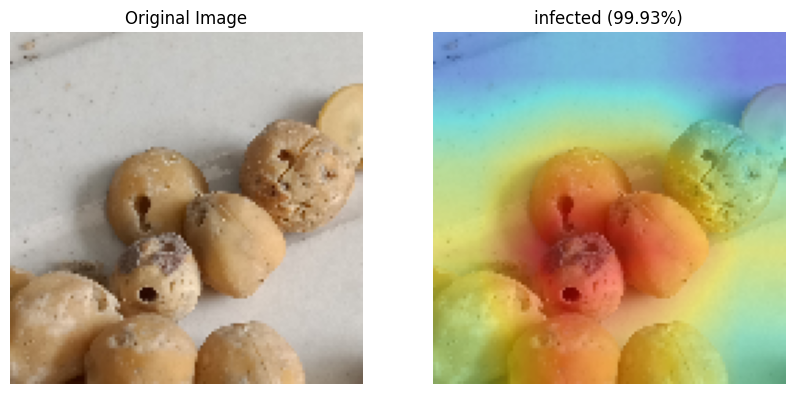

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.37.jpeg to WhatsApp Image 2026-05-03 at 20.23.37.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


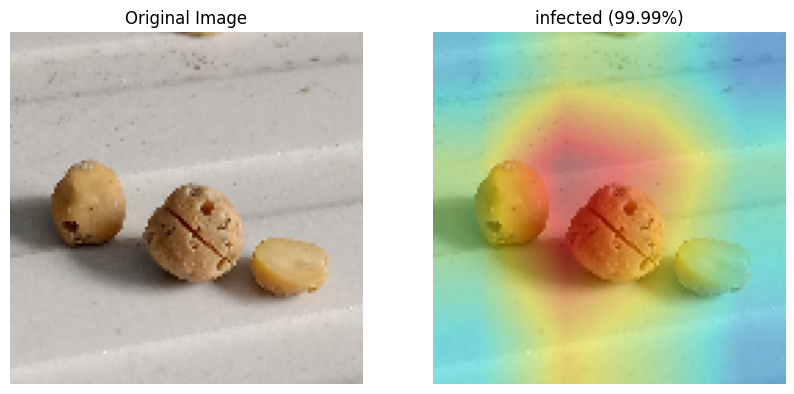

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

gradcam++++

Saving WhatsApp Image 2026-05-03 at 20.23.37 (4).jpeg to WhatsApp Image 2026-05-03 at 20.23.37 (4) (2).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


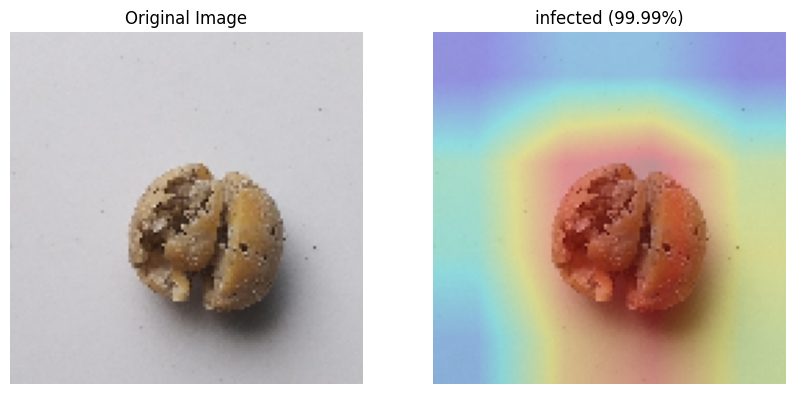

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36 (5).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (5) (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


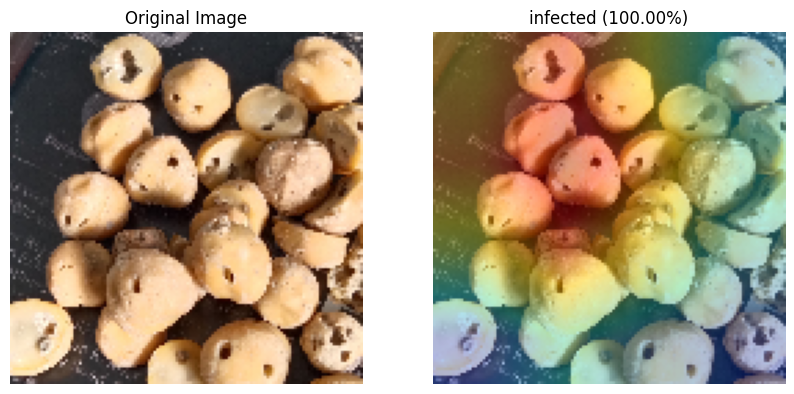

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36 (4).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (4) (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


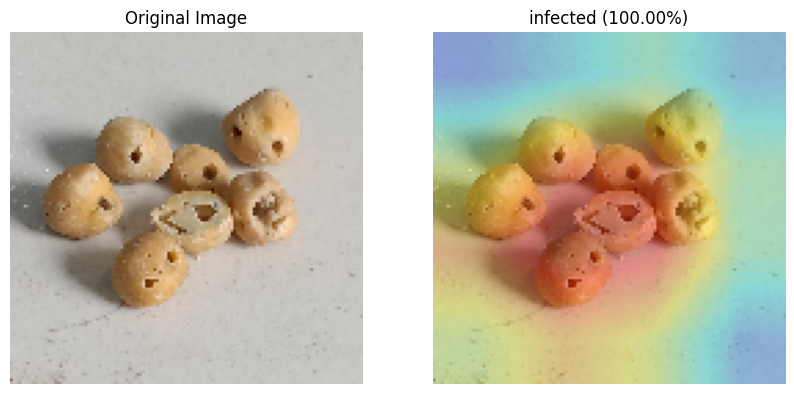

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36 (2).jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (2) (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


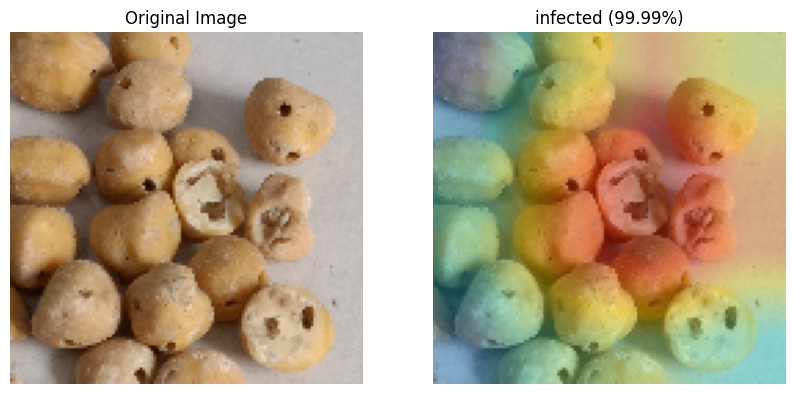

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.36.jpeg to WhatsApp Image 2026-05-03 at 20.23.36 (6).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


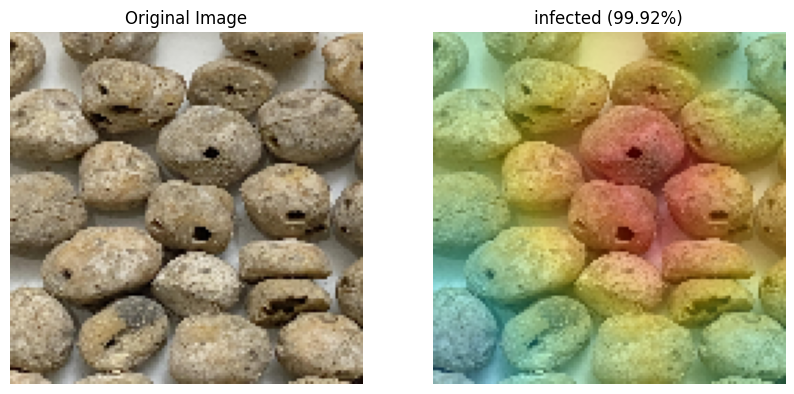

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 20.23.37 (1).jpeg to WhatsApp Image 2026-05-03 at 20.23.37 (1) (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


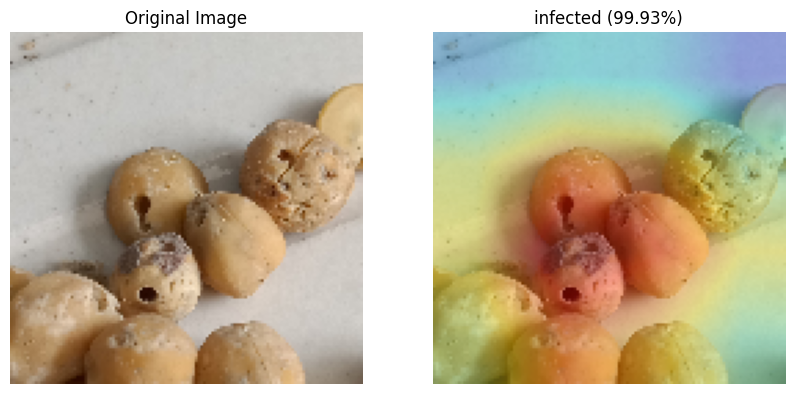

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

# **Mithila new image dilo**

Saving WhatsApp Image 2026-05-03 at 22.42.50 (4).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (4).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


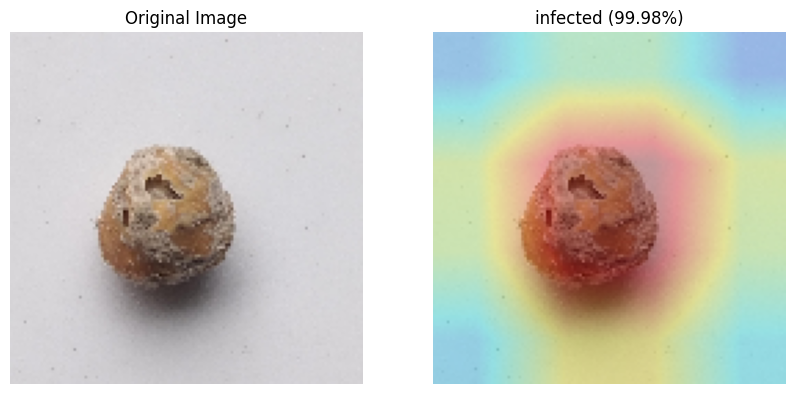

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++ Model
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    # Grad-CAM++ weights calculation
    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    # Weighted combination
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # ReLU + Normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Less aggressive overlay (cleaner)
    overlay = cv2.addWeighted(img_original, 0.7, heatmap, 0.3, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 22.42.50 (4).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (4) (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


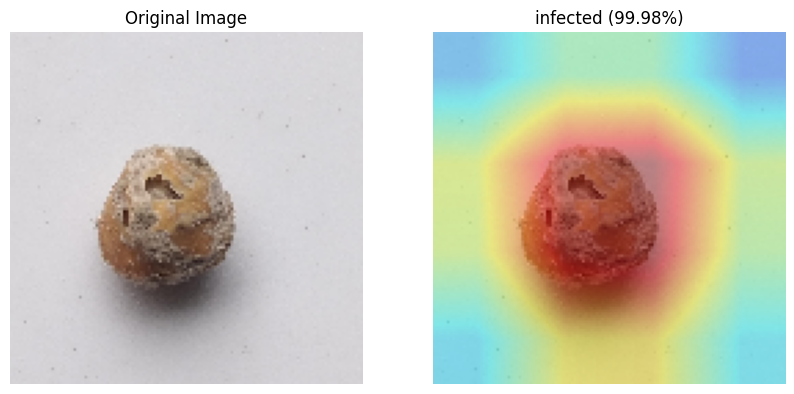

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 22.42.50 (4).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (4) (3).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


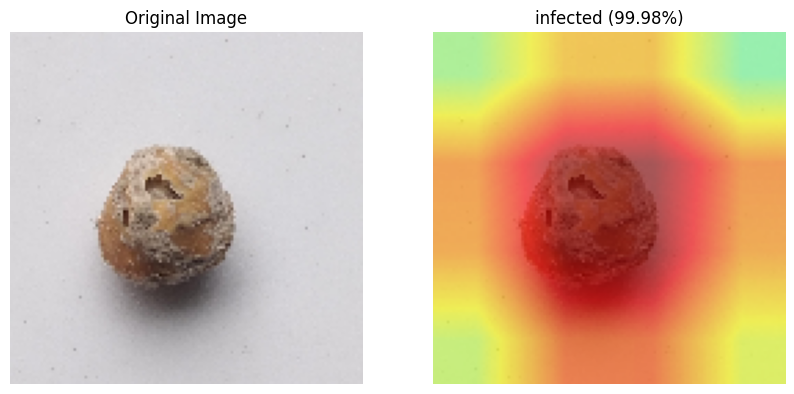

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM++
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)

    grads_power_2 = grads ** 2
    grads_power_3 = grads ** 3

    sum_activations = tf.reduce_sum(conv_outputs, axis=(0,1,2))

    alphas = grads_power_2 / (2 * grads_power_2 + sum_activations * grads_power_3 + 1e-10)
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0,1,2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # --------------------------
    # Enhance Heatmap 🔥
    # --------------------------
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10

    # 🔥 Contrast boost (important)
    heatmap = np.power(heatmap, 0.5)   # lower = more aggressive

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)

    # 🔥 Stronger colormap
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # 🔥 Increase heatmap dominance
    overlay = cv2.addWeighted(img_original, 0.4, heatmap, 0.6, 0)

    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 22.42.50 (3).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (3).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


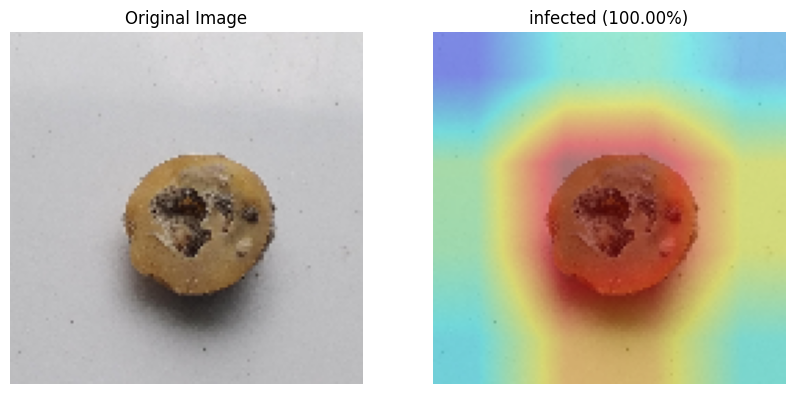

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 22.42.50 (2).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (2).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


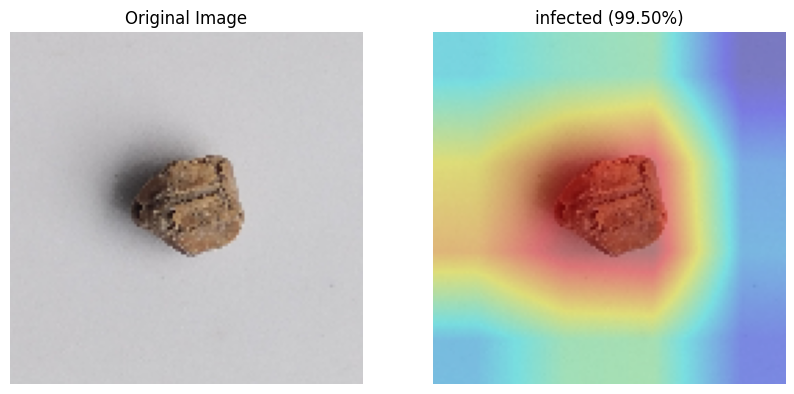

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 22.42.50 (1).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


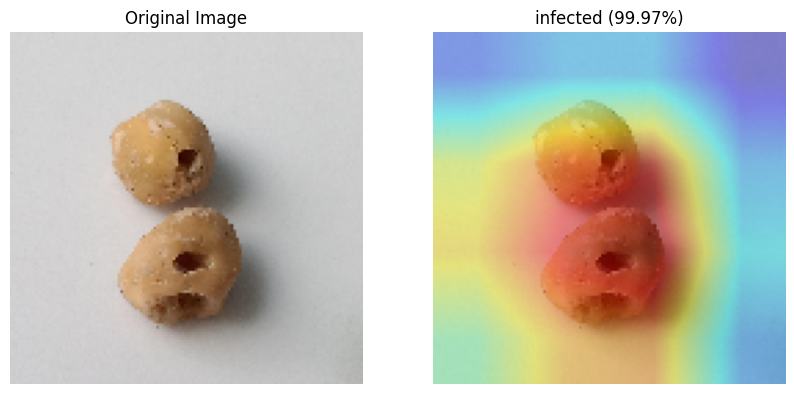

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving WhatsApp Image 2026-05-03 at 22.42.50.jpeg to WhatsApp Image 2026-05-03 at 22.42.50.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


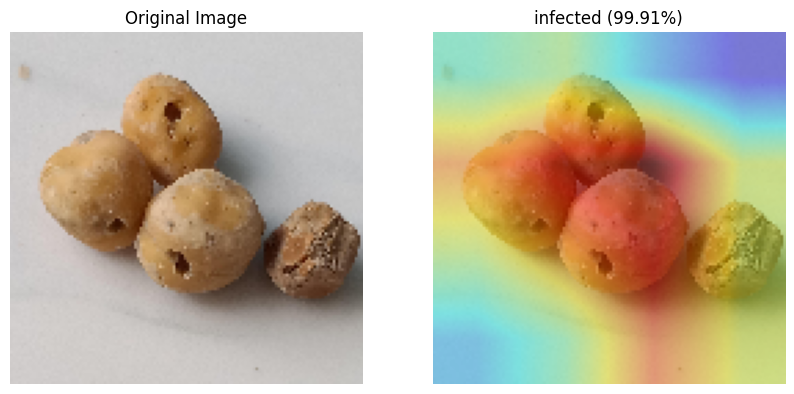

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=3a3d3c7265518c8b144353ea710fe7f1588064e7d6c31528fc534b080eba6e69
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


Saving WhatsApp Image 2026-05-03 at 22.42.50 (4).jpeg to WhatsApp Image 2026-05-03 at 22.42.50 (4) (5).jpeg


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━

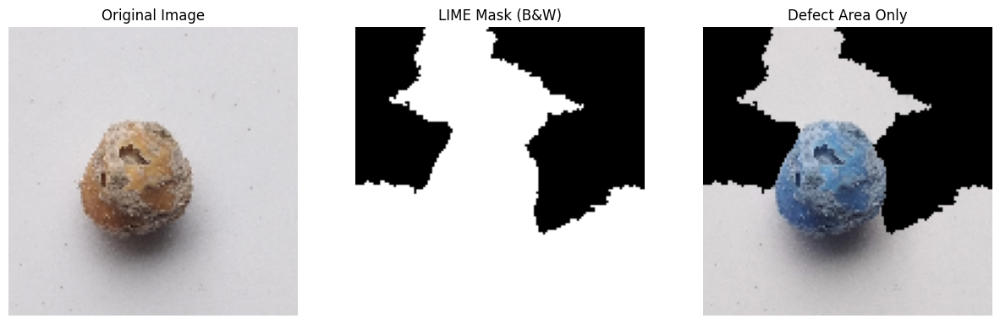

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image
from lime import lime_image

def lime_explain():

    # --------------------------
    # Upload Image
    # --------------------------
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Load Image
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0

    img_for_lime = img_array.copy()

    # --------------------------
    # Prediction function
    # --------------------------
    def predict_fn(images):
        images = np.array(images)
        return model_densenet.predict(images)

    # --------------------------
    # LIME Explainer
    # --------------------------
    explainer = lime_image.LimeImageExplainer()

    explanation = explainer.explain_instance(
        img_for_lime,
        predict_fn,
        top_labels=1,
        hide_color=0,
        num_samples=2000  # better accuracy
    )

    # --------------------------
    # Get mask (main)
    # --------------------------
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=False
    )

    # --------------------------
    # Convert to Black & White Mask
    # --------------------------
    bw_mask = (mask * 255).astype(np.uint8)

    # --------------------------
    # Defect-only image (optional)
    # --------------------------
    img_uint8 = (img_for_lime * 255).astype(np.uint8)

    defect_only = cv2.bitwise_and(
        img_uint8,
        img_uint8,
        mask=mask.astype(np.uint8)
    )

    defect_only = cv2.cvtColor(defect_only, cv2.COLOR_BGR2RGB)

    # --------------------------
    # DISPLAY
    # --------------------------
    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(img_for_lime)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(bw_mask, cmap='gray')
    plt.title("LIME Mask (B&W)")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(defect_only)
    plt.title("Defect Area Only")
    plt.axis("off")

    plt.show()

# RUN
lime_explain()

Saving img_293.jpg to img_293.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_29']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


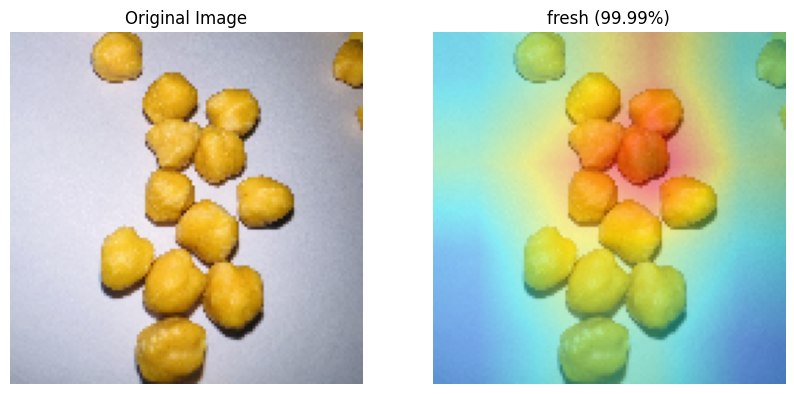

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving img_296.jpg to img_296.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


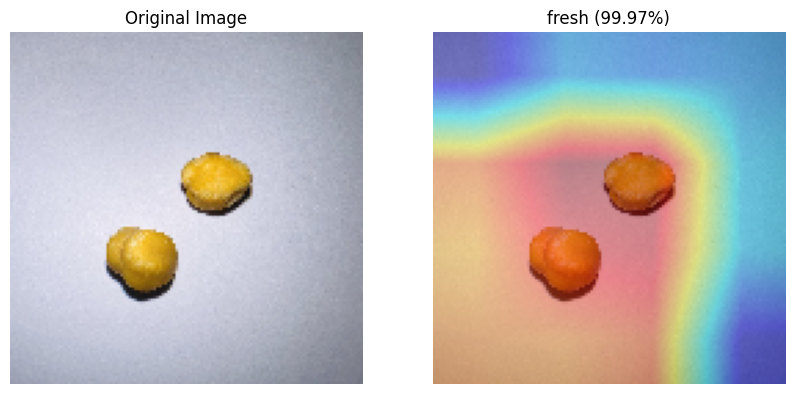

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving 2c.jpg to 2c.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


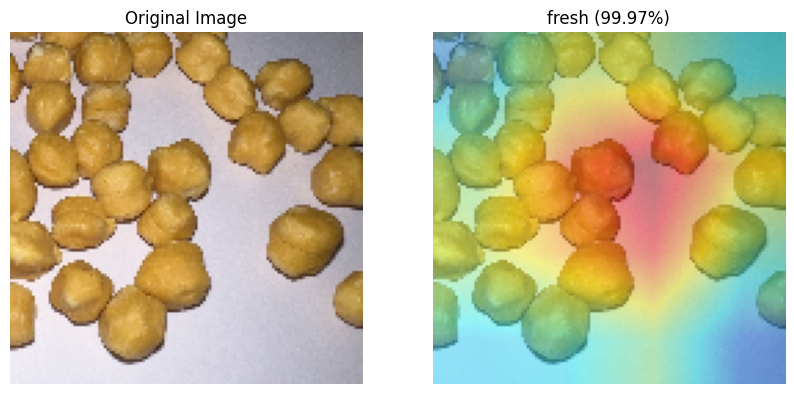

In [ ]:

from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving img_185.jpg to img_185.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


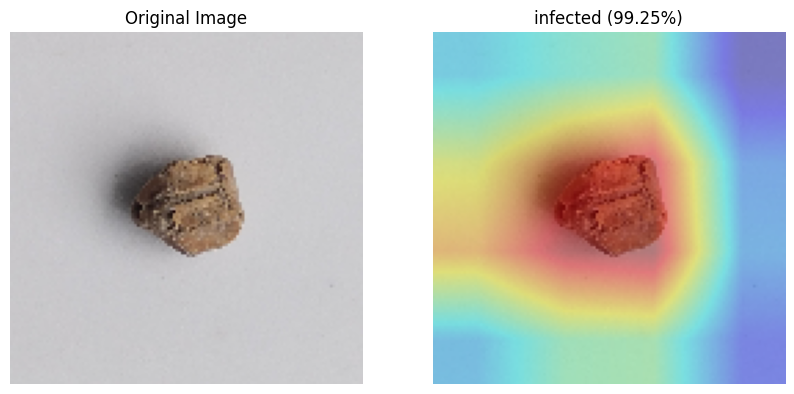

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving img_714.jpg to img_714.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


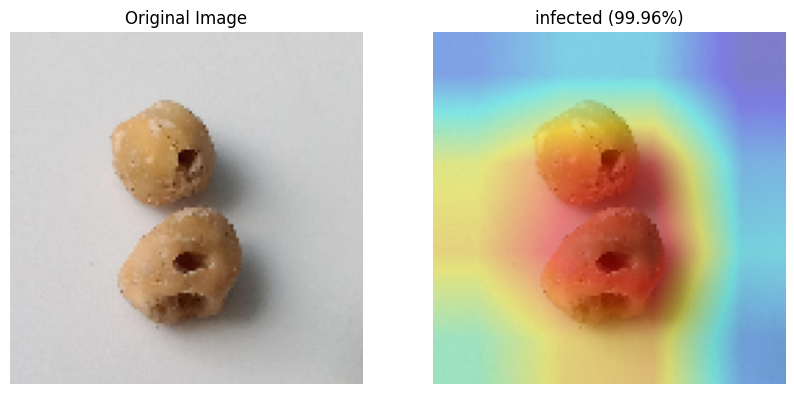

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving img_058.jpg to img_058.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


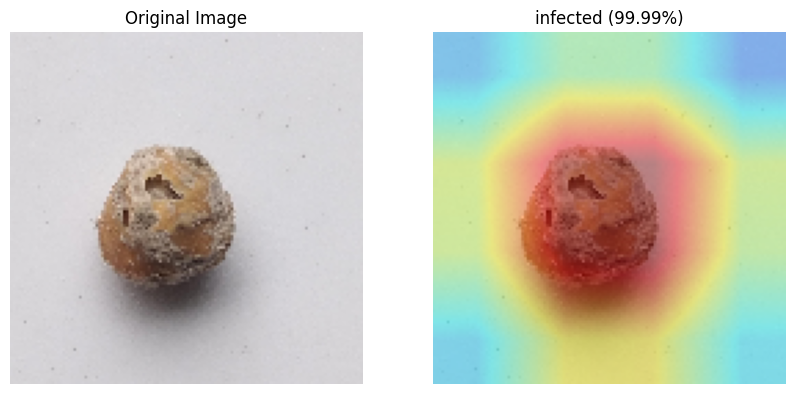

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving img_069.jpg to img_069 (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


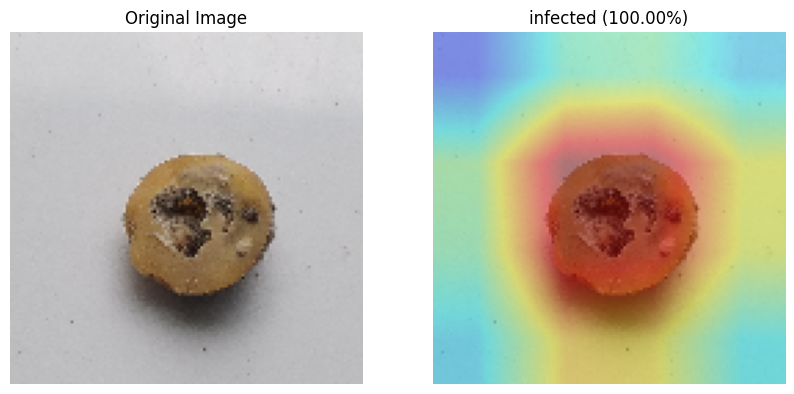

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()

Saving img_713.jpg to img_713.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


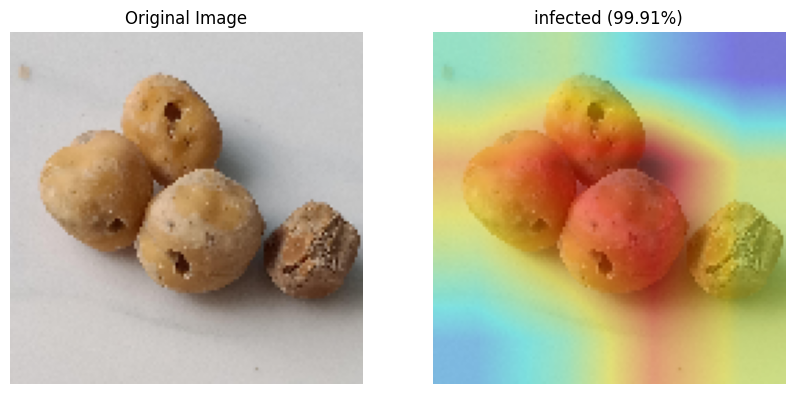

In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image

def gradcam_predict():
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    IMG_SIZE = (128, 128)

    # --------------------------
    # Preprocess
    # --------------------------
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # --------------------------
    # Prediction
    # --------------------------
    preds = model_densenet.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx] * 100
    class_label = class_names[pred_idx]

    # --------------------------
    # Find last conv layer
    # --------------------------
    for layer in reversed(model_densenet.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer.name
            break

    # --------------------------
    # Grad-CAM
    # --------------------------
    grad_model = tf.keras.models.Model(
        [model_densenet.inputs],
        [model_densenet.get_layer(last_conv_layer).output, model_densenet.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    # --------------------------
    # Overlay
    # --------------------------
    img_original = cv2.imread(img_path)
    img_original = cv2.resize(img_original, IMG_SIZE)

    heatmap = cv2.resize(heatmap, IMG_SIZE)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img_original, 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # --------------------------
    # SHOW SIDE BY SIDE
    # --------------------------
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_original)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title(f"{class_label} ({confidence:.2f}%)")
    plt.axis("off")

    plt.show()


# Run
gradcam_predict()